In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.read_csv('spotify.csv', index_col=0, usecols=[2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20])
data.head(20)

,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
artists,,,,,,,,,,,,,,,,,
Gen Hoshino,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
Ben Woodward,Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
Ingrid Michaelson;ZAYN,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
Kina Grannis,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
Chord Overstreet,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
Tyrone Wells,Days I Will Remember,58,214240,False,0.688,0.4810,6,-8.807,1,0.1050,0.2890,0.000000,0.1890,0.6660,98.017,4,acoustic
A Great Big World;Christina Aguilera,Say Something,74,229400,False,0.407,0.1470,2,-8.822,1,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3,acoustic
Jason Mraz,I'm Yours,80,242946,False,0.703,0.4440,11,-9.331,1,0.0417,0.5590,0.000000,0.0973,0.7120,150.960,4,acoustic
Jason Mraz;Colbie Caillat,Lucky,74,189613,False,0.625,0.4140,0,-8.700,1,0.0369,0.2940,0.000000,0.1510,0.6690,130.088,4,acoustic


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 114000 entries, Gen Hoshino to Cesária Evora
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_name        113999 non-null  object 
 1   popularity        114000 non-null  int64  
 2   duration_ms       114000 non-null  int64  
 3   explicit          114000 non-null  bool   
 4   danceability      114000 non-null  float64
 5   energy            114000 non-null  float64
 6   key               114000 non-null  int64  
 7   loudness          114000 non-null  float64
 8   mode              114000 non-null  int64  
 9   speechiness       114000 non-null  float64
 10  acousticness      114000 non-null  float64
 11  instrumentalness  114000 non-null  float64
 12  liveness          114000 non-null  float64
 13  valence           114000 non-null  float64
 14  tempo             114000 non-null  float64
 15  time_signature    114000 non-null  int64  
 16  track_ge

In [4]:
print(data.shape)

(114000, 17)


In [5]:
duplicated_rows = data.duplicated().sum()
print(duplicated_rows)

data = data.drop_duplicates()
duplicated_rows = data.duplicated().sum()
print(duplicated_rows)

7057
0


In [6]:
data2 = data[[column for column in data if data[column].count() / len(data) >= 0.3]]
print("List of dropped columns:", end=" ")
for c in data.columns:
    if c not in data2.columns:
        print(c, end=", ")
print('\n')
data = data2

List of dropped columns: 



count    106943.000000
mean         35.353366
std          21.338655
min           0.000000
25%          20.000000
50%          37.000000
75%          51.000000
max         100.000000
Name: popularity, dtype: float64


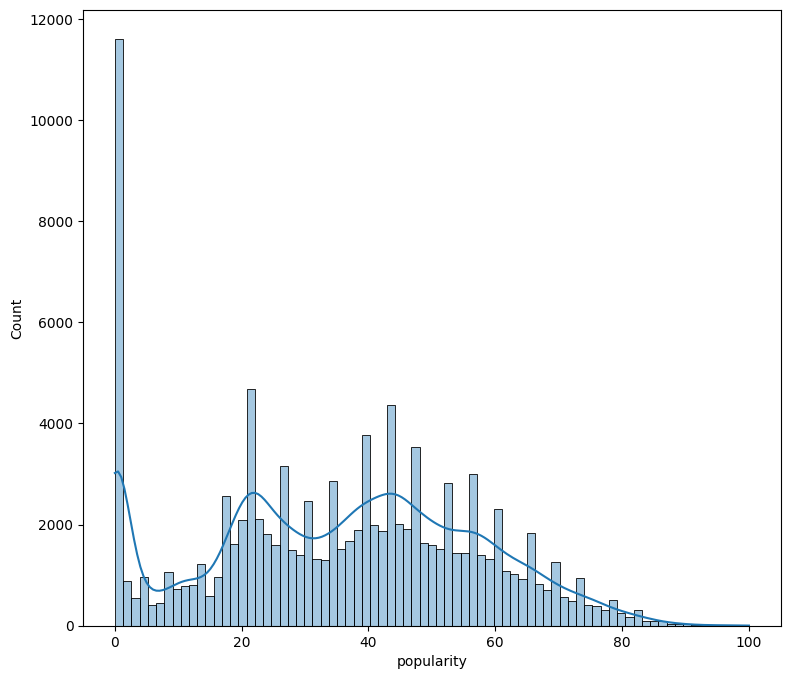

In [7]:
print(data['popularity'].describe())
plt.figure(figsize=(9, 8));
sns.histplot(data=data['popularity'], alpha = 0.4, kde=True);

In [8]:
df_num = data.select_dtypes(include = 'number')
df_num.head()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
artists,,,,,,,,,,,,,,
Gen Hoshino,73,230666,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4
Ben Woodward,55,149610,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4
Ingrid Michaelson;ZAYN,57,210826,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4
Kina Grannis,71,201933,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3
Chord Overstreet,82,198853,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4


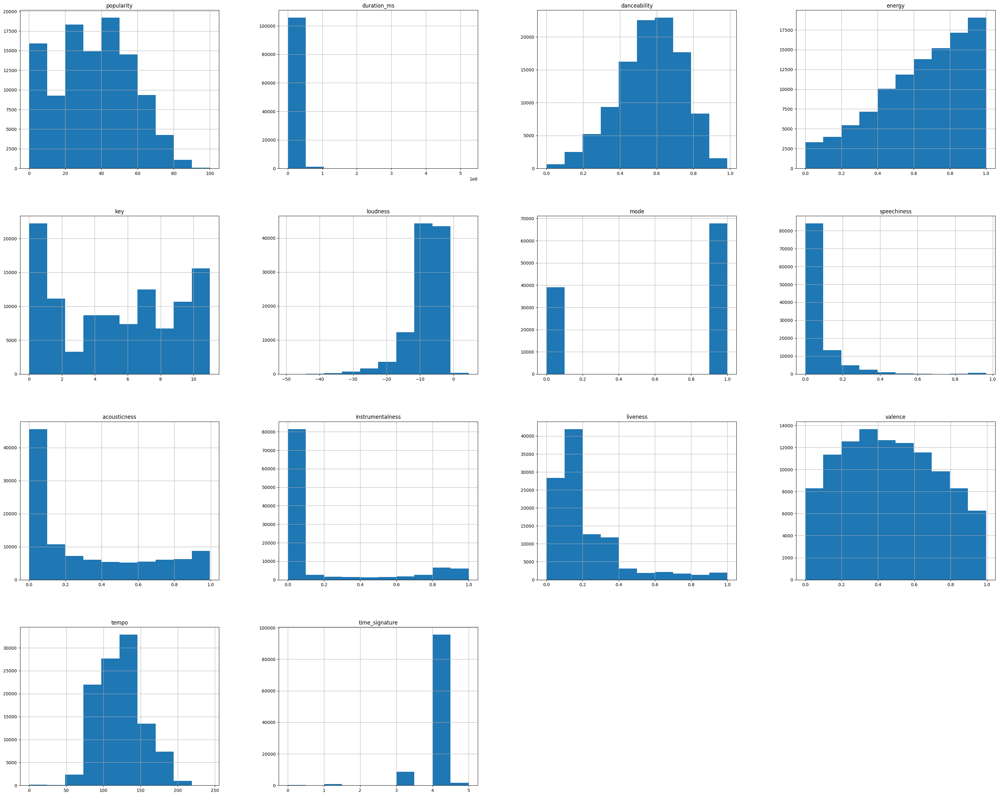

In [9]:
df_num.hist(figsize=(40, 32), bins=10);

In [10]:
df_cate = data.select_dtypes(include = ['O'])
print('There are {} non numerical features including:\n{}'.format(len(df_cate.columns), df_cate.columns.tolist()))

There are 2 non numerical features including:
['track_name', 'track_genre']


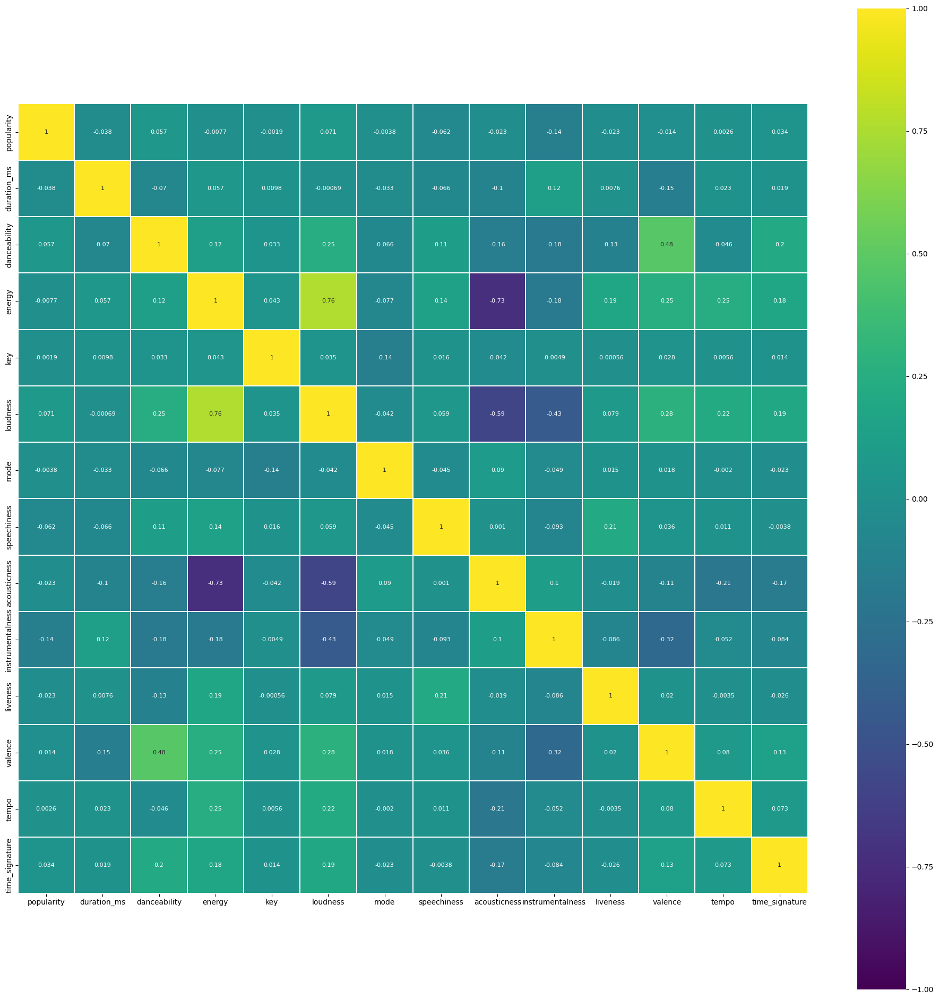

In [11]:
df_corr = df_num.corr(numeric_only = True)
plt.figure(figsize=(24, 24))

sns.heatmap(df_corr, 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

In [12]:
df_corr = df_corr['popularity']
golden_features_list = df_corr[abs(df_corr) > 0.5].sort_values(ascending=False)
print("There is {} strongly correlated values with popularity:\n{}".format(len(golden_features_list), golden_features_list))

There is 1 strongly correlated values with popularity:
popularity    1.0
Name: popularity, dtype: float64


acoustic
afrobeat
alt-rock
alternative
ambient
anime
black-metal
bluegrass
blues
brazil
breakbeat
british
cantopop
chicago-house
children
chill
classical
club
comedy
country
dance
dancehall
death-metal
deep-house


/var/folders/bn/jrb03ff14g36yb1bhq_fww6m0000gn/T/ipykernel_31986/2253743393.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(24, 24))


detroit-techno
disco
disney
drum-and-bass
dub
dubstep
edm
electro
electronic
emo
folk
forro
french
funk
garage
german
gospel
goth
grindcore
groove
grunge
guitar
happy
hard-rock
hardcore
hardstyle
heavy-metal
hip-hop
honky-tonk
house
idm
indian
indie
indie-pop
industrial
iranian
j-dance
j-idol
j-pop
j-rock
jazz
k-pop
kids
latin
latino
malay
mandopop
metal
metalcore
minimal-techno
mpb
new-age
opera
pagode
party
piano
pop
pop-film
power-pop
progressive-house
psych-rock
punk
punk-rock
r-n-b
reggae
reggaeton
rock
rock-n-roll
rockabilly
romance
sad
salsa
samba
sertanejo
show-tunes
singer-songwriter
ska
sleep
songwriter
soul
spanish
study
swedish
synth-pop
tango
techno
trance
trip-hop
turkish
world-music


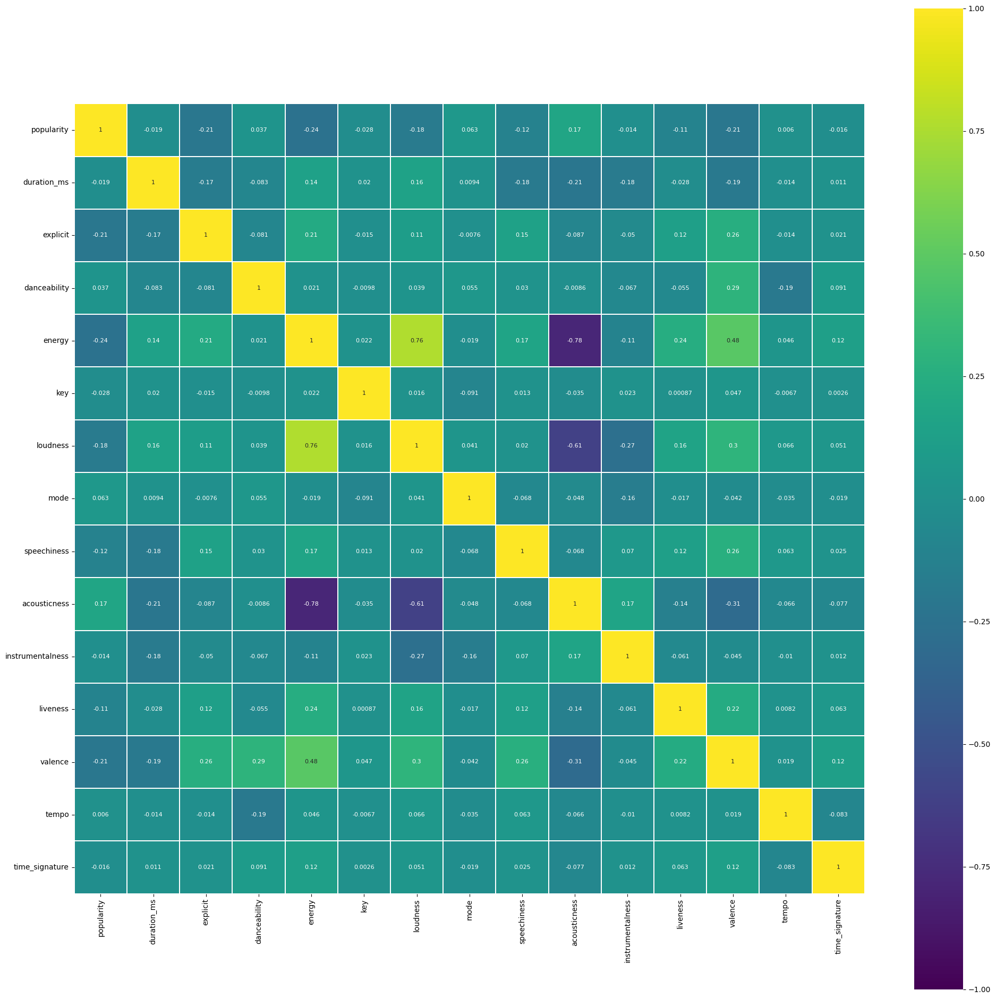

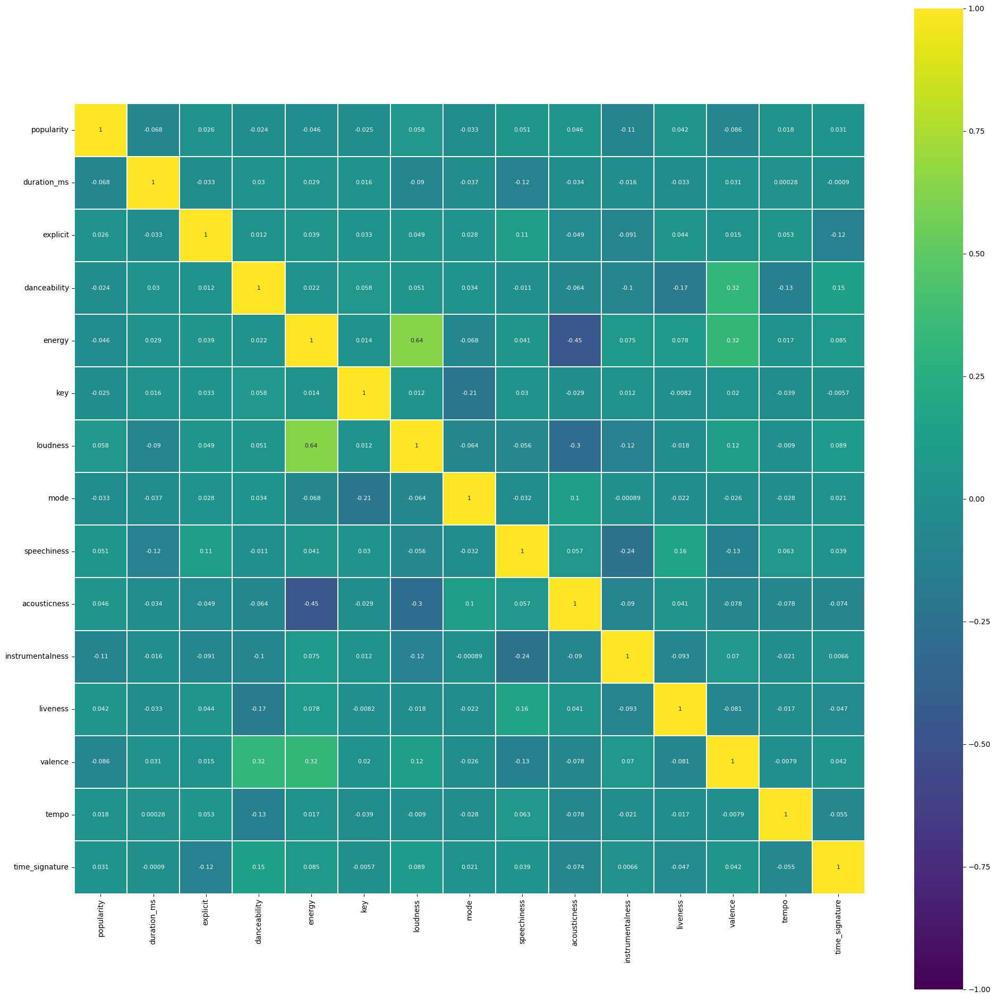

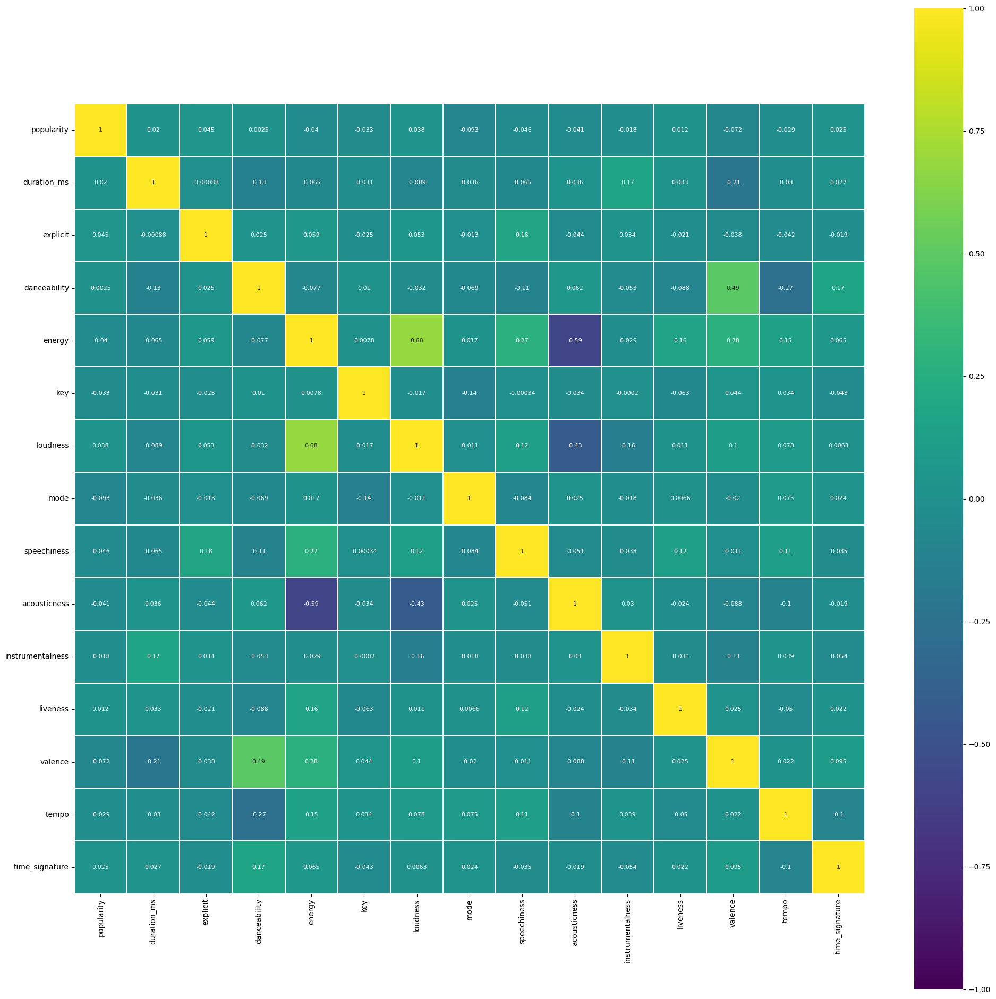

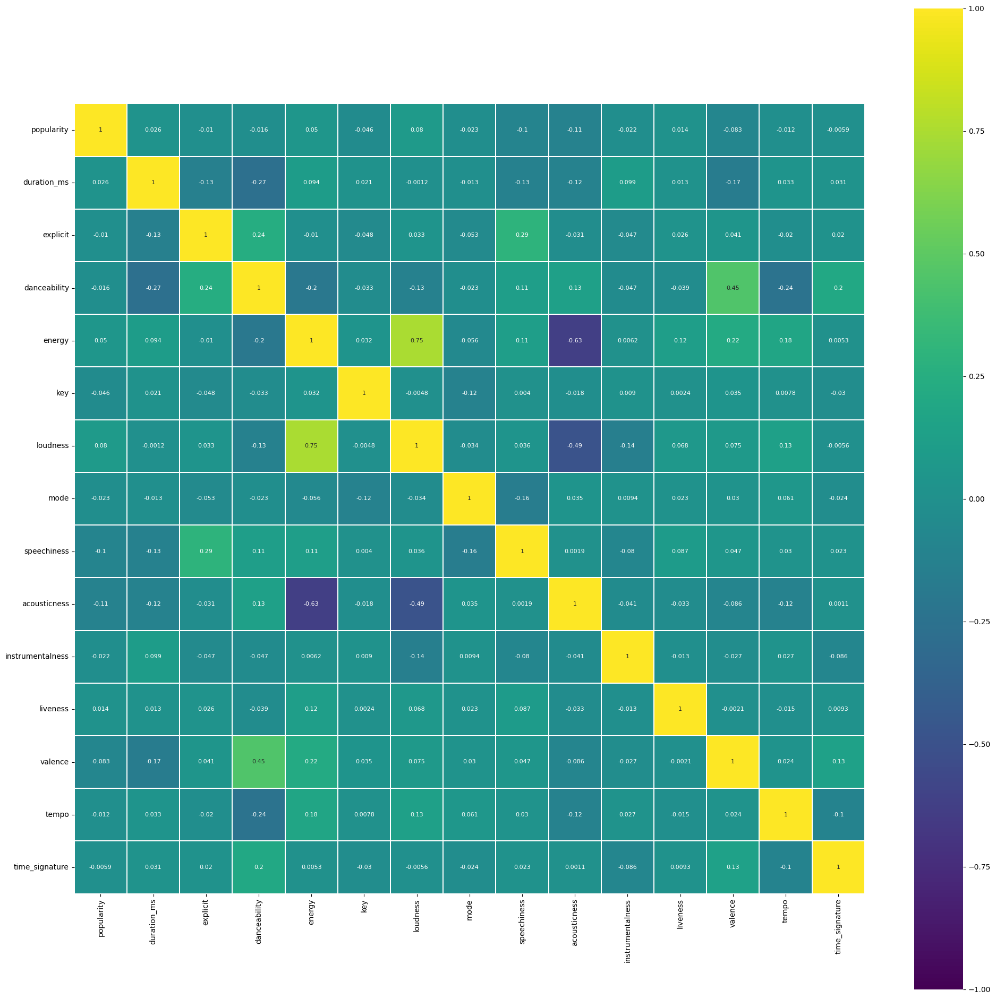

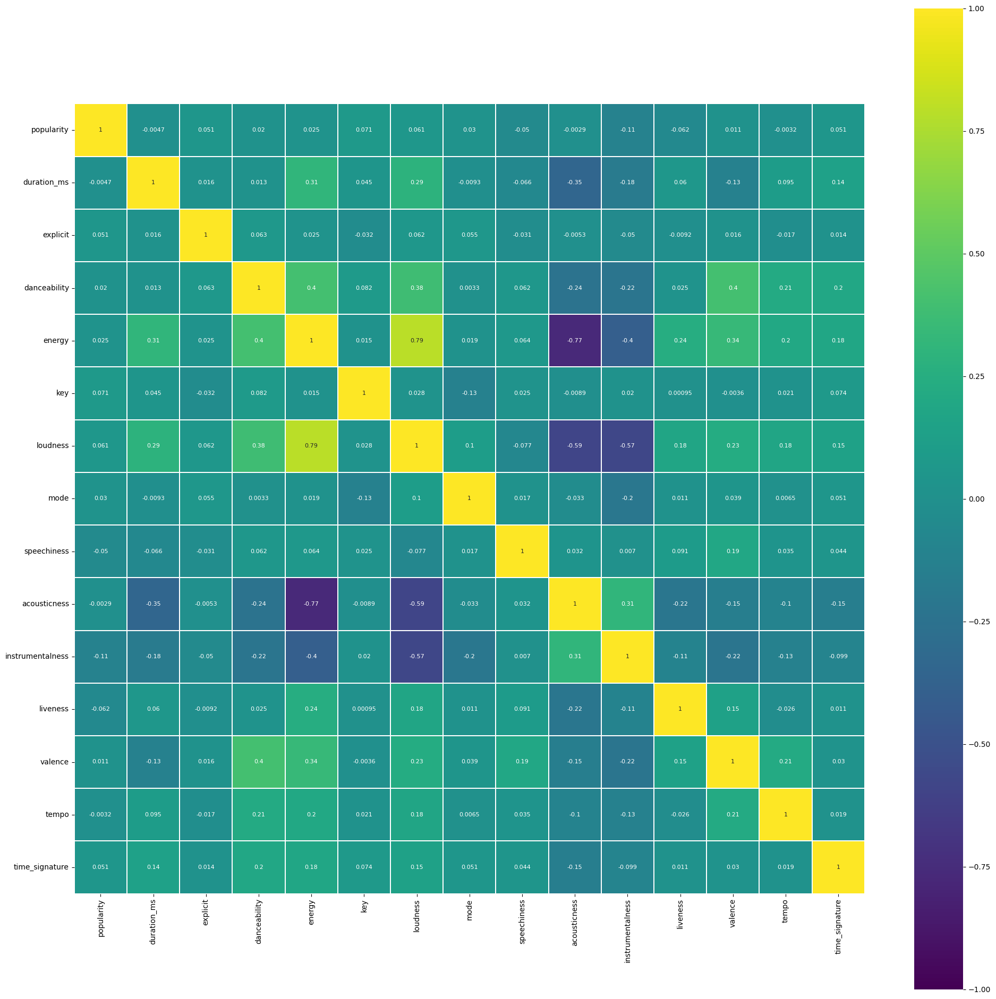

...

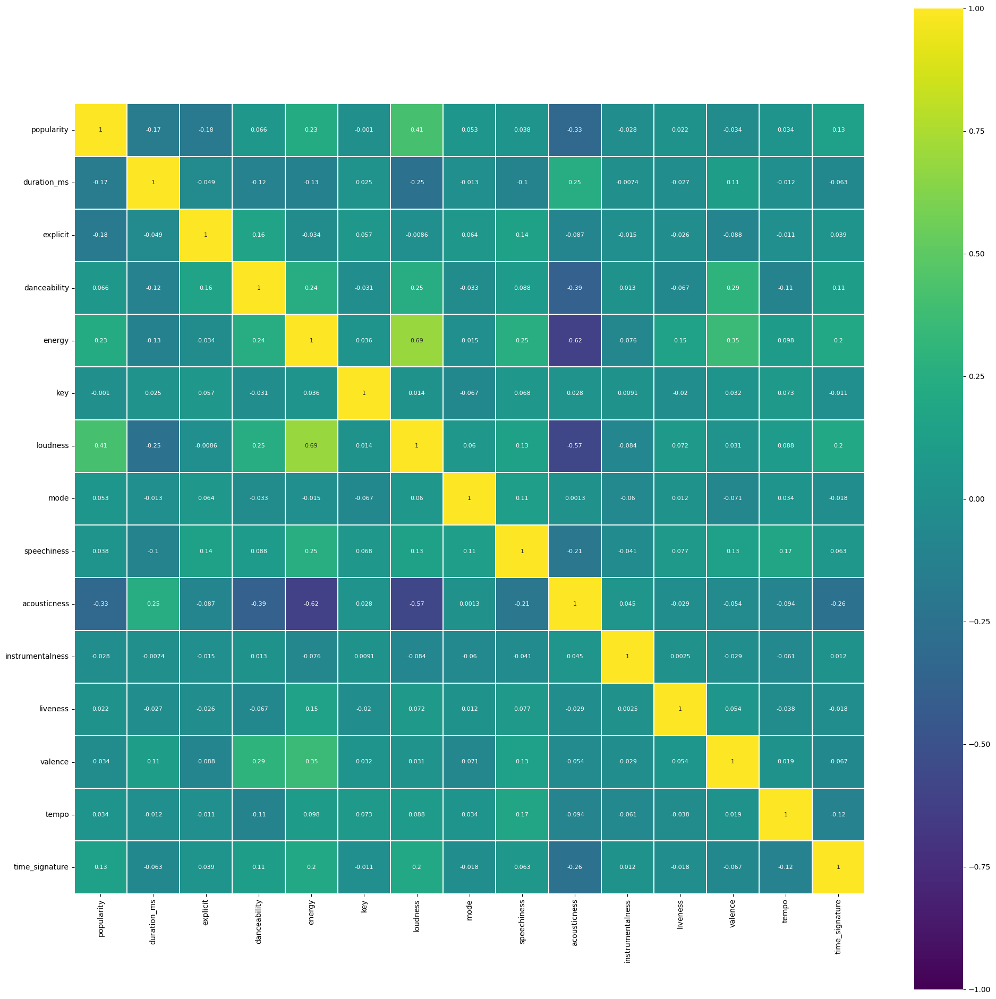

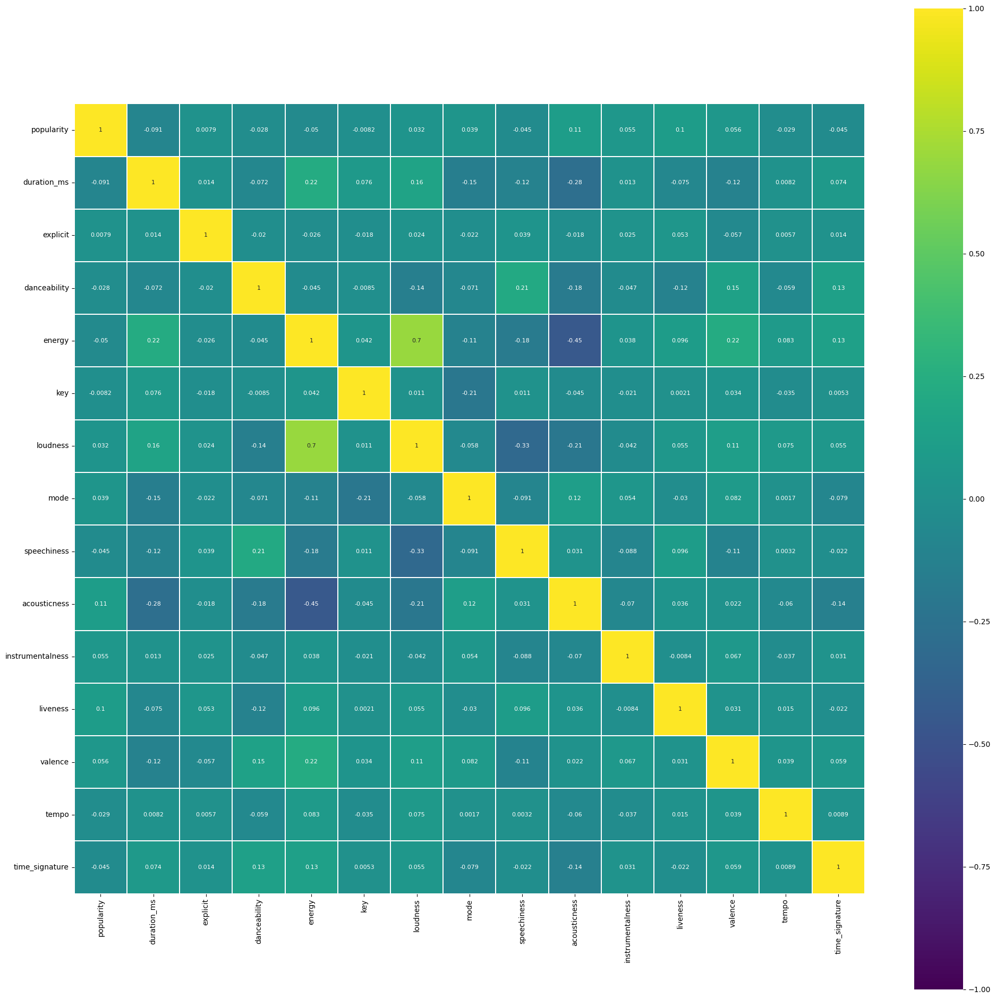

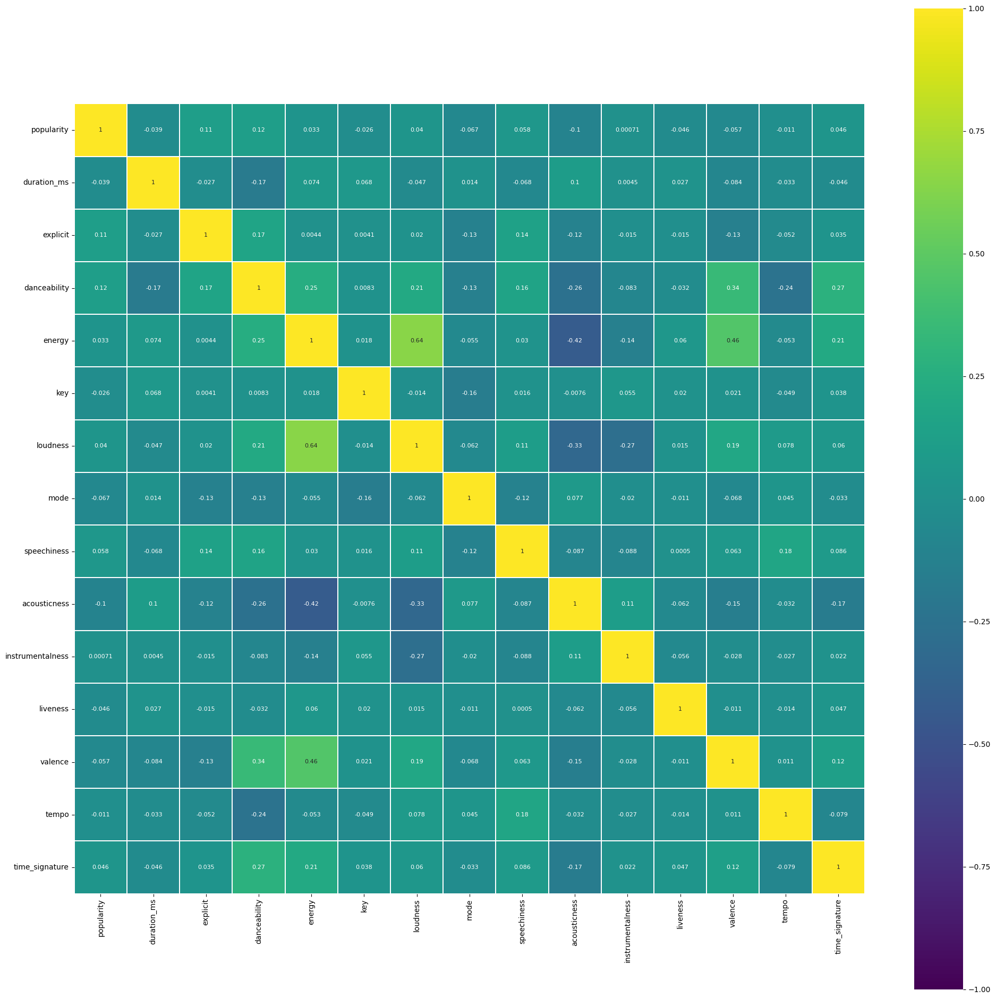

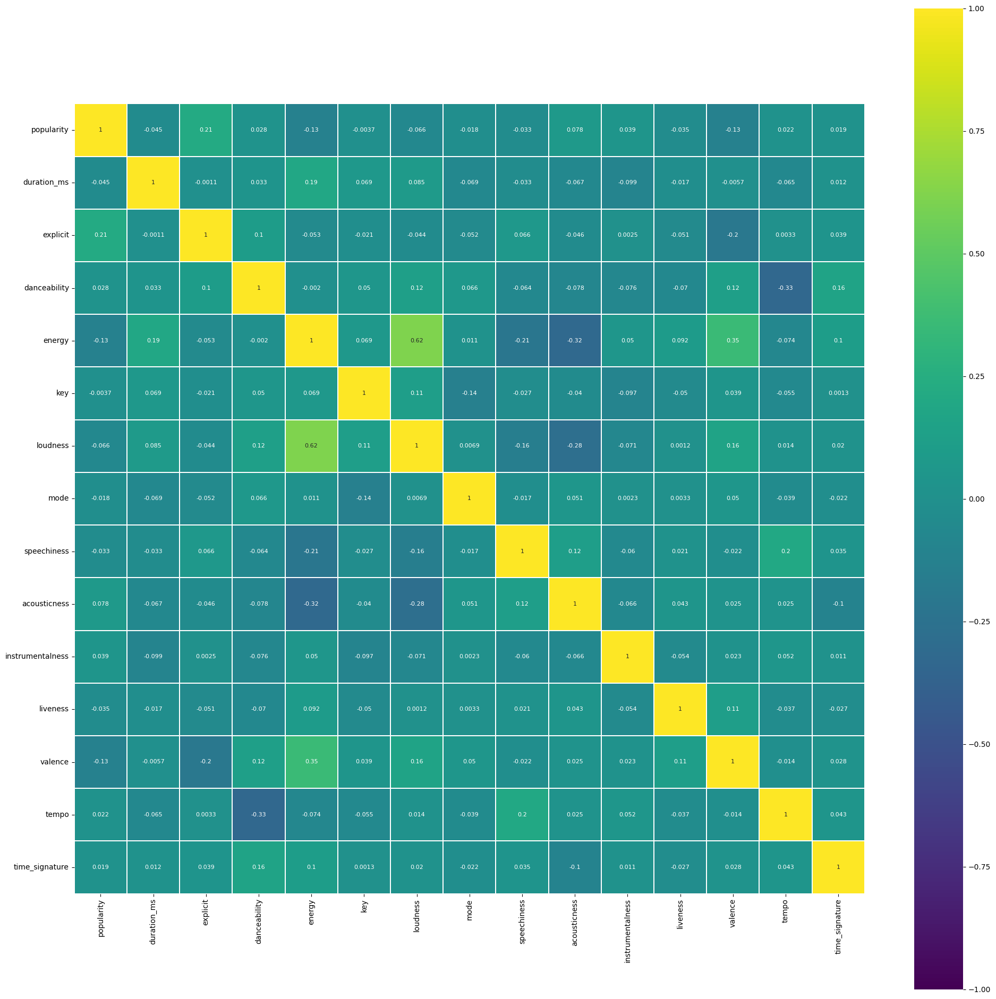

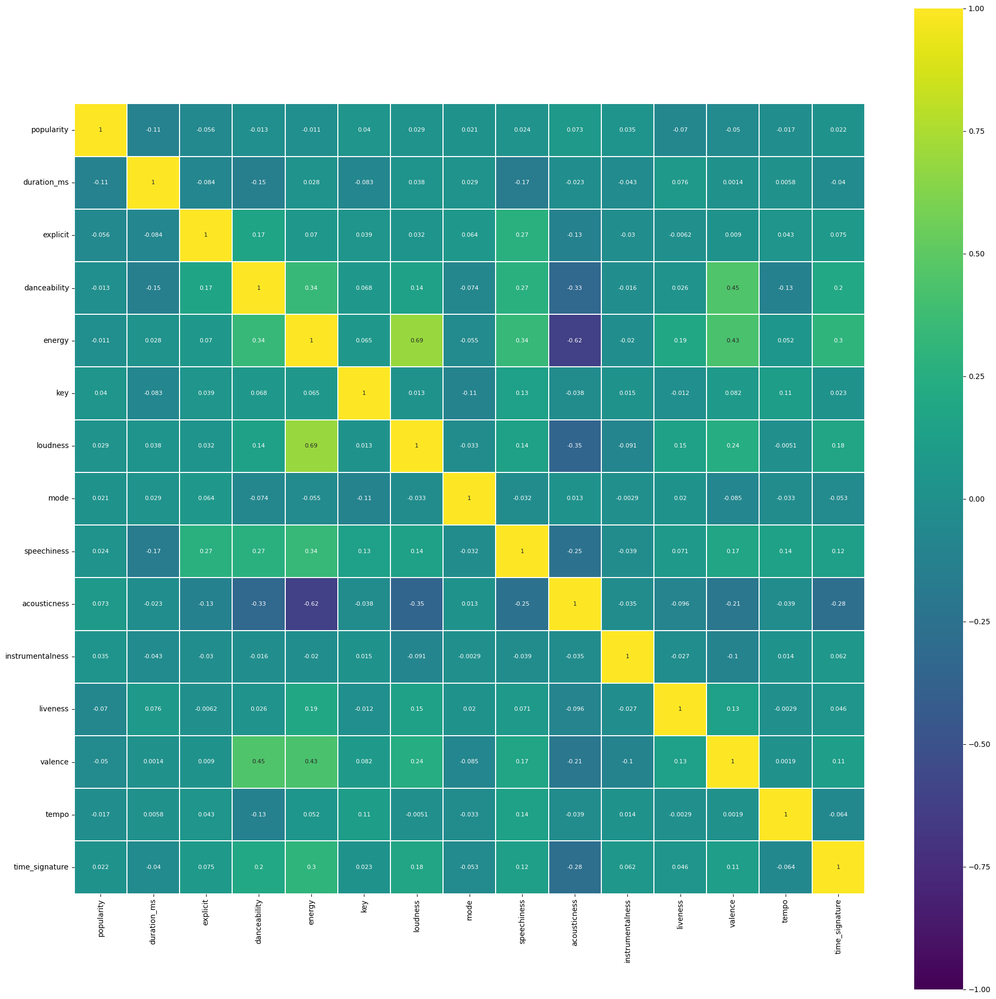

In [ ]:
for genre, group in data.groupby('track_genre'):
    
        print(genre)
        group_corr = group.corr(numeric_only = True)
        plt.figure(figsize=(24, 24))
        sns.heatmap(group_corr, 
                cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
                annot=True, annot_kws={"size": 8}, square=True);
    